In [1]:
import pandas as pd
import numpy as np
from tqdm.notebook import tqdm

import shap
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.io as pio

from xgboost import XGBRegressor
import pickle
from tensorflow.keras.models import load_model

import warnings
warnings.filterwarnings("ignore")

In [2]:
models = []
models.append(pickle.load(open("models/xgb_energy_ideal_opt_16.dat", "rb")))
models.append(pickle.load(open("models/xgb_energy_real_opt_16.dat", "rb")))
models.append(load_model("models/5M_ideal.h5"))
models.append(load_model("models/5M_real.h5"))

scalers = []
scalers.append(pickle.load(open('models/scaler_ideal.pkl','rb')))
scalers.append(pickle.load(open('models/scaler_real.pkl','rb')))

In [3]:
path='/mnt/cephfs/ml_data/mc_2021/'

data_ideal = pd.read_csv('{}processed_data/ProcessedTrainIdeal/ProcessedTrain.csv.gz'.format(path))
data_ideal = data_ideal[data_ideal['edepR'] < 17.2]

data_real = pd.read_csv('{}processed_data/ProcessedTrainReal/ProcessedTrain.csv.gz'.format(path))
data_real = data_real[data_real['edepR'] < 17.2]

In [4]:
all_data = [data_ideal, data_real]*2

In [5]:
from sklearn.model_selection import train_test_split

X_trains = []
y_trains = []

X_vals = []
y_vals = []

for i in range(len(all_data)):
    if i < 2:
        opt_features = ['AccumCharge', 'R_cht', 'z_cc', 'pe_std',
                        'nPMTs', 'ht_kurtosis', 'ht_25-20p', 'R_cc',
                        'ht_5-2p', 'pe_mean', 'jacob_cht', 'phi_cc',
                        'ht_35-30p', 'ht_20-15p', 'pe_35p', 'ht_30-25p',]
    else:
        opt_features = ['AccumCharge', 'nPMTs', 'R_cc', 'R_cht', 'pe_mean',
                        'pe_std', 'pe_skew', 'pe_kurtosis', 'pho_cc', 'pho_cht',
                        'ht_2p', 'ht_5p', 'ht_10p', 'ht_15p', 'ht_20p',
                        'ht_25p', 'ht_30p', 'ht_35p', 'ht_40p', 'ht_45p',
                        'ht_50p', 'ht_55p', 'ht_60p', 'ht_65p', 'ht_70p',
                        'ht_75p', 'ht_80p', 'ht_85p', 'ht_90p', 'ht_95p',]

    X = all_data[i].iloc[:, :-5]
    y = all_data[i].iloc[:, -5]
    
    X_train, X_val, y_train, y_val = train_test_split(
        X, y, test_size=0.1, random_state=22)
        
    X_vals.append(X_val[opt_features])
    y_vals.append(y_val)

# BDT Real

In [6]:
explainer = shap.Explainer(models[1], X_vals[1][:5000])
shap_values = explainer(X_vals[1][:5000])

100%|===================| 4997/5000 [09:42<00:00]        

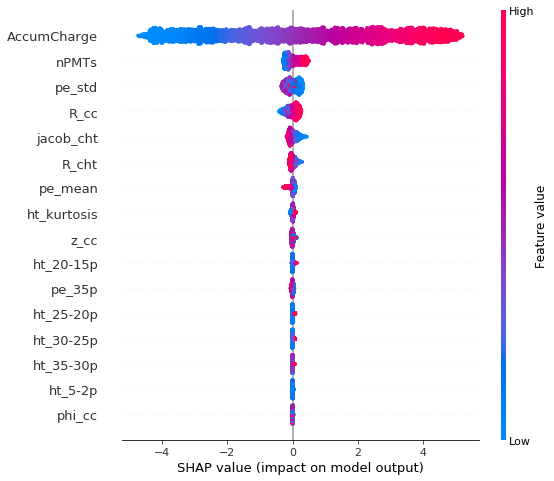

In [7]:
shap.summary_plot(shap_values[:5000], X_vals[1][:5000], show=False)
fig = plt.gcf()
plt.savefig("plots/features_imp/local_explanations_xgb_real.pdf", width=500, height=500)

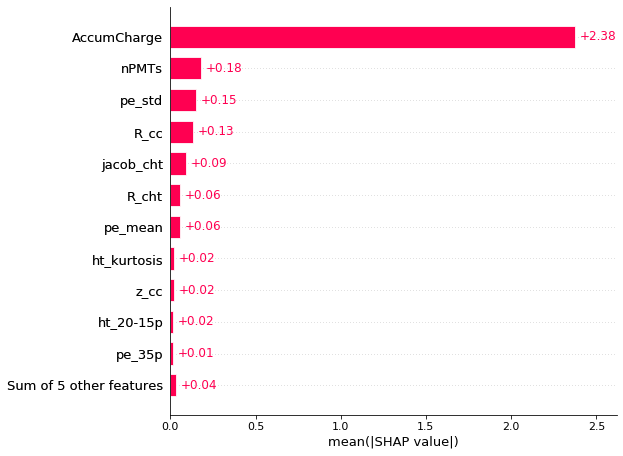

In [8]:
shap.plots.bar(shap_values[:5000], max_display=12, show=False)
fig = plt.gcf()
plt.savefig("plots/features_imp/global_explanation_xgb_real.pdf", width=500, height=500)

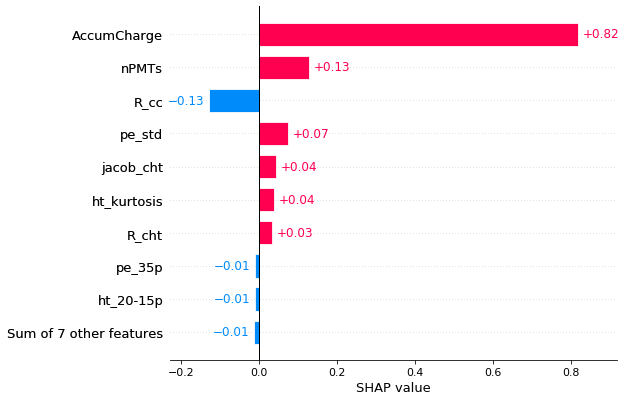

In [9]:
shap.plots.bar(shap_values[1], show=False)
fig = plt.gcf()
plt.savefig("plots/features_imp/local_explanation_xgb_real.pdf", width=500, height=500)

In [10]:
# shap.plots.bar(shap_values.cohorts(2).abs.mean(0))

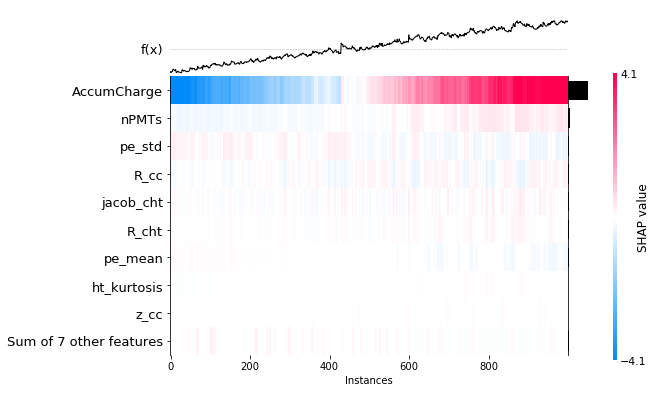

In [11]:
shap.plots.heatmap(shap_values[:1000], show=False)
fig = plt.gcf()
plt.savefig("plots/features_imp/heatmap_xgb_real.pdf", width=500, height=500)

In [12]:
opt_features = ['AccumCharge', 'R_cht', 'z_cc', 'pe_std',
                'nPMTs', 'ht_kurtosis', 'ht_25-20p', 'R_cc',
                'ht_5-2p', 'pe_mean', 'jacob_cht', 'phi_cc',
                'ht_35-30p', 'ht_20-15p', 'pe_35p', 'ht_30-25p',]

In [13]:
pio.templates.default = 'plotly_white'

fig = make_subplots(8, 4,
                    vertical_spacing=0,
                   )

for k in range(1, 5, 1):
    for j in range(1, 5):
        fig.add_trace(
            go.Scattergl(
                x=shap_values[:, (k-1)*4 + j - 1].data,
                y=shap_values[:, (k-1)*4 + j - 1].values,
                mode='markers',
                marker=dict(
                    size=1
                ),
                showlegend=False
            ), row=2*k-1, col=j
        )

        fig.add_trace(
            go.Histogram(
                x=shap_values[:, (k-1)*4 + j - 1].data,
                showlegend=False
            ), row=2*k, col=j
        )


for i in range(2, 10, 2):
    for j in range(1, 5):
        fig.update_yaxes(showticklabels=False, row=i, col=j, 
                         domain=[0.86-(i/2-1)*0.25, 0.875-(i/2-1)*0.25],
                         showgrid=False, zeroline=True)
        fig.update_xaxes(title_text=f"{opt_features[(int(i/2) - 1)*4 + j - 1]}",
                        row=i, col=j, showgrid=False, showline=True, linecolor='black',)
        
for i in range(1, 8, 2):
    for j in range(1, 5):
        fig.update_xaxes(showticklabels=False, row=i, col=j,) 
        fig.update_yaxes(showline=True, linecolor='black',)
    fig.update_yaxes(title_text="SHAP value", row=i, col=1)

fig.update_layout(
    width=900,
    height=900,

)
        
fig.show()
pio.write_image(fig, "plots/features_imp/shap_values.pdf",
                width=900, height=900)

In [14]:
clustering = shap.utils.hclust(X_vals[1][:5000], y_val[:5000])

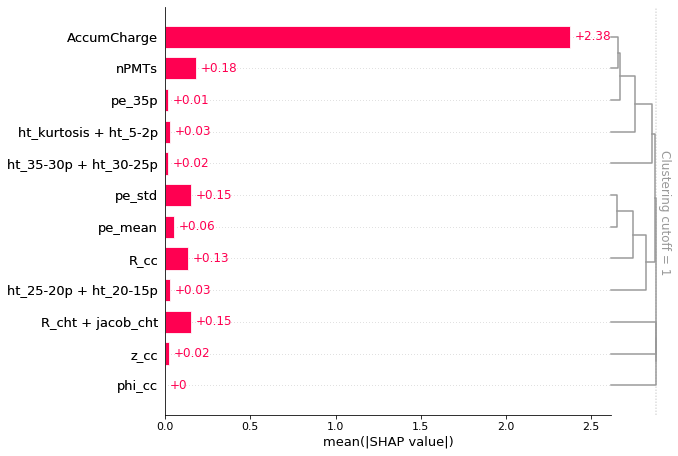

In [15]:
shap.plots.bar(shap_values, clustering=clustering, max_display=12, clustering_cutoff=1, show=False)
fig = plt.gcf()
plt.savefig("plots/features_imp/clustering_xgb_real.pdf", width=500, height=500)

In [16]:
shap_values = shap.TreeExplainer(models[1]).shap_values(X_vals[1][:5000])

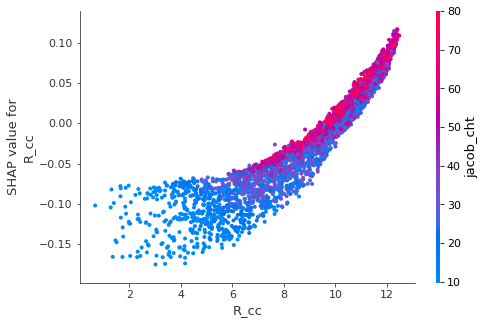

In [17]:
shap.dependence_plot("R_cc", shap_values, X_vals[1][:5000], interaction_index="jacob_cht")

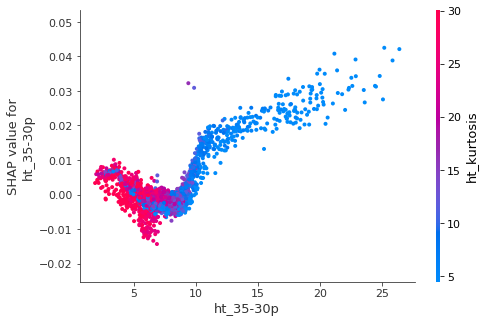

In [18]:
shap.dependence_plot("ht_35-30p", shap_values, X_vals[1][:5000], interaction_index="ht_kurtosis")

# FCDNN Real